In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'): #datos de la competencia
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/store-sales-time-series-forecasting/oil.csv
/kaggle/input/store-sales-time-series-forecasting/sample_submission.csv
/kaggle/input/store-sales-time-series-forecasting/holidays_events.csv
/kaggle/input/store-sales-time-series-forecasting/stores.csv
/kaggle/input/store-sales-time-series-forecasting/train.csv
/kaggle/input/store-sales-time-series-forecasting/test.csv
/kaggle/input/store-sales-time-series-forecasting/transactions.csv


In [2]:
# Plotting libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import matplotlib.ticker as mticker
from PIL import Image
import matplotlib.dates as mdates
import matplotlib.image as img
#pd.options.display_format = '{:.4f}'.format
import gc

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
DATA_PATH = '../input/store-sales-time-series-forecasting/'

In [4]:
for f in os.listdir(DATA_PATH):
    print(f)

oil.csv
sample_submission.csv
holidays_events.csv
stores.csv
train.csv
test.csv
transactions.csv


In [5]:
df_train = pd.read_csv(os.path.join(DATA_PATH, 'train.csv'))
df_test = pd.read_csv(os.path.join(DATA_PATH, 'test.csv'))
df_stores = pd.read_csv(os.path.join(DATA_PATH, 'stores.csv'))
df_transactions = pd.read_csv(os.path.join(DATA_PATH, 'transactions.csv'))
df_oil = pd.read_csv(os.path.join(DATA_PATH, 'oil.csv'))
#df_holidays = pd.read_csv(os.path.join(DATA_PATH, 'holidays_events.csv'))

In [6]:
df_train2 = pd.read_csv(os.path.join(DATA_PATH, 'train.csv'), 
    usecols=['store_nbr', 'family', 'date', 'sales'],
    dtype={ # set datatypes in advance for ease of use
        'store_nbr': 'category',
        'family': 'category',
        'sales': 'float32',
    },
    parse_dates=['date'],
    infer_datetime_format=True,)

df_holidays = pd.read_csv(
    DATA_PATH + 'holidays_events.csv',
    dtype={ # set datatypes in advance for ease of use
        'type': 'category',
        'locale': 'category',
        'locale_name': 'category',
        'description': 'category',
        'transferred': 'bool',
    },
    parse_dates=['date'],
    infer_datetime_format=True,
)
df_holidays = df_holidays.set_index('date').to_period('D')

df_train2['date'] = df_train2.date.dt.to_period('D')
store_sales = df_train2.set_index(['store_nbr', 'family', 'date']).sort_index()

In [7]:
df_train.describe()

,id,store_nbr,sales,onpromotion
count,3.000888e+06,3.000888e+06,3.000888e+06,3.000888e+06
mean,1.500444e+06,2.750000e+01,3.577757e+02,2.602770e+00
std,8.662819e+05,1.558579e+01,1.101998e+03,1.221888e+01
min,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00
25%,7.502218e+05,1.400000e+01,0.000000e+00,0.000000e+00
50%,1.500444e+06,2.750000e+01,1.100000e+01,0.000000e+00
75%,2.250665e+06,4.100000e+01,1.958473e+02,0.000000e+00
max,3.000887e+06,5.400000e+01,1.247170e+05,7.410000e+02


In [8]:
df_train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [9]:
# Convertir a formato de tipo fecha en lugar de string y se guarda en la misma columna
df_train['date'] = pd.to_datetime(df_train['date'])
df_test['date'] = pd.to_datetime(df_test.date) # Misma format de hacer lo anterior. Hace referencia al título de la columna
df_transactions['date'] = pd.to_datetime(df_transactions['date'])

In [10]:
df_train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


In [11]:
# Cambiar formato de datos
df_train['onpromotion'] = df_train.onpromotion.astype('float16')
df_train['sales'] = df_train.sales.astype('float32')
df_stores.cluster = df_stores.cluster.astype('int8')

## Very Basic EDA

In [12]:
df_train

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.000000,0.0
1,1,2013-01-01,1,BABY CARE,0.000000,0.0
2,2,2013-01-01,1,BEAUTY,0.000000,0.0
3,3,2013-01-01,1,BEVERAGES,0.000000,0.0
4,4,2013-01-01,1,BOOKS,0.000000,0.0
...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.132996,0.0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.552994,1.0
3000885,3000885,2017-08-15,9,PRODUCE,2419.729004,148.0
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000000,8.0


In [13]:
average_sales = df_train.groupby('date').mean()['sales']

/tmp/ipykernel_32/558563387.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  average_sales = df_train.groupby('date').mean()['sales']


In [14]:
average_sales

date
2013-01-01      1.409438
2013-01-02    278.390808
2013-01-03    202.840195
2013-01-04    198.911163
2013-01-05    267.873260
                 ...    
2017-08-11    463.733856
2017-08-12    444.798309
2017-08-13    485.768616
2017-08-14    427.004730
2017-08-15    427.980896
Name: sales, Length: 1684, dtype: float32

<Axes: xlabel='date'>

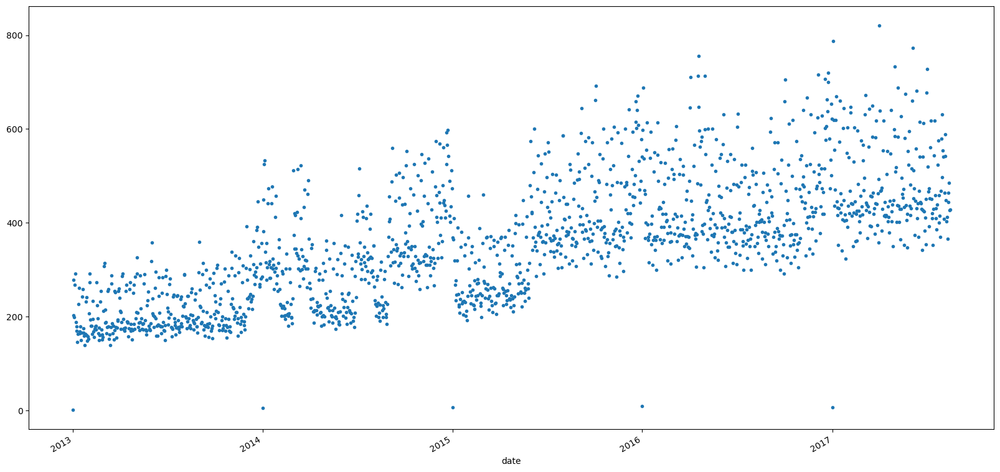

In [15]:
average_sales.plot(style='.', figsize=(20,10))

In [16]:
# Copia de la variable
avg_train = average_sales.copy()

In [17]:
# Calcular promedio de una año, luego el siguiente, etc. Promedia por años
moving_avg = avg_train.rolling(window=365, center=True, min_periods=183).mean() #183 porque es la mitad del 365

<Axes: xlabel='date'>

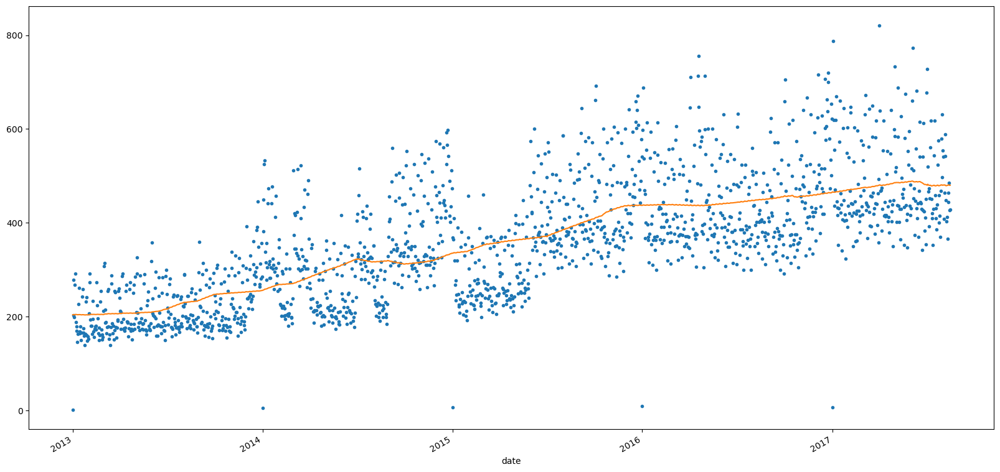

In [18]:
avg_train.plot(style='.', figsize=(20,10))
moving_avg.plot()

In [19]:
average_transactions = df_transactions.groupby('date').mean()['transactions']
avg_trans = average_transactions.copy()
moving_avg_trans = avg_trans.rolling(window=365, center=True, min_periods=183).mean()

<Axes: xlabel='date'>

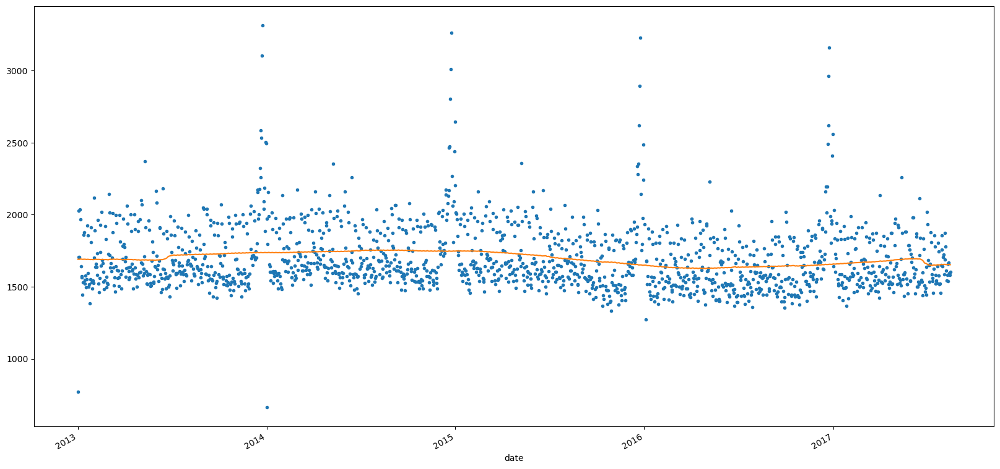

In [20]:
avg_trans.plot(style='.', figsize=(20,10))
moving_avg_trans.plot()

In [21]:
#Agrupar por fecha y tienda. SUma las ventas por tiena y por fecha y lo vamos a utilizar como índice
df_train_aux = df_train.groupby(['date', 'store_nbr']).sales.sum().reset_index() 

In [22]:
# Combinar el train_aux con el transactions
df_aux_merged = pd.merge(df_train_aux, df_transactions, how='left')

In [23]:
df_aux_merged

,date,store_nbr,sales,transactions
0,2013-01-01,1,0.000000,NaN
1,2013-01-01,2,0.000000,NaN
2,2013-01-01,3,0.000000,NaN
3,2013-01-01,4,0.000000,NaN
4,2013-01-01,5,0.000000,NaN
...,...,...,...,...
90931,2017-08-15,50,16879.121094,2804.0
90932,2017-08-15,51,20154.558594,1573.0
90933,2017-08-15,52,18600.044922,2255.0
90934,2017-08-15,53,8208.189453,932.0


In [24]:
pearson_corr = df_aux_merged.corr('pearson')['sales'].loc['transactions']
spearman_corr = df_aux_merged.corr('spearman')['sales'].loc['transactions']

/tmp/ipykernel_32/2132006310.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  pearson_corr = df_aux_merged.corr('pearson')['sales'].loc['transactions']
/tmp/ipykernel_32/2132006310.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  spearman_corr = df_aux_merged.corr('spearman')['sales'].loc['transactions']


In [25]:
# Gracias a las correlaciones veo proporcionalidades. Ver cuáles son las variables 
# o atributos de un data set que tiene mayor relación, dependencias lineales
print(pearson_corr, spearman_corr)

0.8373836801236554 0.8174644342997851


In [26]:
df_sorted_trans = df_transactions.sort_values(['store_nbr', 'date'])

In [27]:
# Cada colpr es una tienda diferente
px.line(df_sorted_trans, x='date', y='transactions', color='store_nbr')

In [28]:
aux_a = df_transactions.copy()
aux_a['year'] = aux_a.date.dt.year # Sacar el año. TOmar fecha, tomar como tipo datetime (dt) y tomar el año
aux_a['month'] = aux_a['date'].dt.month

In [29]:
aux_a

,date,store_nbr,transactions,year,month
0,2013-01-01,25,770,2013,1
1,2013-01-02,1,2111,2013,1
2,2013-01-02,2,2358,2013,1
3,2013-01-02,3,3487,2013,1
4,2013-01-02,4,1922,2013,1
...,...,...,...,...,...
83483,2017-08-15,50,2804,2017,8
83484,2017-08-15,51,1573,2017,8
83485,2017-08-15,52,2255,2017,8
83486,2017-08-15,53,932,2017,8


In [30]:
px.box(aux_a, x='year', y='transactions', color='month')

In [31]:
# Promedio por mes
aux_a = df_transactions.set_index('date').resample('M').transactions.mean().reset_index()

In [32]:
aux_a['year'] = aux_a.date.dt.year

In [33]:
px.line(aux_a, x='date', y='transactions', color='year')

In [34]:
# Correlación positiva
px.scatter(df_aux_merged, x='transactions', y='sales', trendline='ols', trendline_color_override = 'red')

In [35]:
aux_a = df_transactions.copy()
# Crear columnas de año y día de la semana
aux_a['year'] = aux_a['date'].dt.year
aux_a['dayofweek'] = aux_a['date'].dt.dayofweek + 1 #1 para que empiece en lunes
aux_a = aux_a.groupby(['year', 'dayofweek'])

In [36]:
aux_a.head(10)

,date,store_nbr,transactions,year,dayofweek
0,2013-01-01,25,770,2013,2
1,2013-01-02,1,2111,2013,3
2,2013-01-02,2,2358,2013,3
3,2013-01-02,3,3487,2013,3
4,2013-01-02,4,1922,2013,3
...,...,...,...,...,...
71714,2017-01-08,5,1062,2017,7
71715,2017-01-08,6,2146,2017,7
71716,2017-01-08,7,1543,2017,7
71717,2017-01-08,8,2706,2017,7


In [37]:
aux = df_train.set_index('date').groupby('store_nbr').resample('D').sales.sum().reset_index()

In [38]:
px.line(aux, x='date', y='sales', color='store_nbr')

In [39]:
df_train[((df_train.store_nbr == 52) & (df_train.date < '2017-04-20'))]

,id,date,store_nbr,family,sales,onpromotion
1551,1551,2013-01-01,52,AUTOMOTIVE,0.0,0.0
1552,1552,2013-01-01,52,BABY CARE,0.0,0.0
1553,1553,2013-01-01,52,BEAUTY,0.0,0.0
1554,1554,2013-01-01,52,BEVERAGES,0.0,0.0
1555,1555,2013-01-01,52,BOOKS,0.0,0.0
...,...,...,...,...,...,...
2790409,2790409,2017-04-19,52,POULTRY,0.0,0.0
2790410,2790410,2017-04-19,52,PREPARED FOODS,0.0,0.0
2790411,2790411,2017-04-19,52,PRODUCE,0.0,0.0
2790412,2790412,2017-04-19,52,SCHOOL AND OFFICE SUPPLIES,0.0,0.0


In [40]:
print(df_train.shape)

(3000888, 6)


In [41]:
# Reescribir el dataframe
df_train = df_train[~((df_train.store_nbr == 52) & (df_train.date < '2017-04-20'))]
df_train = df_train[~((df_train.store_nbr == 22) & (df_train.date < '2015-10-09'))]
df_train = df_train[~((df_train.store_nbr == 42) & (df_train.date < '2015-08-21'))]
df_train = df_train[~((df_train.store_nbr == 21) & (df_train.date < '2015-07-24'))]
df_train = df_train[~((df_train.store_nbr == 29) & (df_train.date < '2015-03-20'))]
df_train = df_train[~((df_train.store_nbr == 20) & (df_train.date < '2015-02-13'))]
df_train = df_train[~((df_train.store_nbr == 53) & (df_train.date < '2014-05-29'))]
df_train = df_train[~((df_train.store_nbr == 36) & (df_train.date < '2013-05-09'))]

In [42]:
df_train.shape

(2780316, 6)

In [43]:
# Crea una nueva columna llamada ind que va a ser un acumulador
aux = df_train[['store_nbr', 'sales']].copy()
aux['ind'] = 1
# Suma en la columna int / Acumula el número de registros por tienda / Contar el número de registros por tienda
aux['ind'] = aux.groupby('store_nbr').ind.cumsum().values

In [44]:
aux

,store_nbr,sales,ind
0,1,0.000000,1
1,1,0.000000,2
2,1,0.000000,3
3,1,0.000000,4
4,1,0.000000,5
...,...,...,...
3000883,9,438.132996,55568
3000884,9,154.552994,55569
3000885,9,2419.729004,55570
3000886,9,121.000000,55571


In [45]:
aux = pd.pivot(aux, index='ind', columns='store_nbr', values='sales')

In [46]:
aux

store_nbr,1,2,3,4,5,6,7,8,9,10,...,45,46,47,48,49,50,51,52,53,54
ind,,,,,,,,,,,,,,,,,,,,,
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,17.0,8.0,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.0,11.0,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4036.0,1409.0,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55568,234.891998,365.424011,1155.024048,372.485992,241.011002,434.570007,622.672974,548.981995,438.132996,102.077003,...,1132.536011,631.656006,960.400024,670.679016,926.492004,356.510010,686.940979,NaN,NaN,59.618999
55569,42.822998,90.848999,222.294006,44.084999,52.120998,102.341995,136.360992,143.714005,154.552994,26.000000,...,188.238007,95.587997,277.028015,80.585999,207.888000,73.851997,91.975998,NaN,NaN,94.000000
55570,2240.229980,2006.874023,7265.289062,2031.764038,1357.822998,2073.635986,5113.960938,3939.392090,2419.729004,256.911011,...,4973.191895,2155.658936,5146.251953,1438.812012,6316.367188,2027.374023,5031.189941,NaN,NaN,915.370972


In [47]:
# Correlación
aux = aux.corr()

In [48]:
# Coorrelación entre tiendas
aux

store_nbr,1,2,3,4,5,6,7,8,9,10,...,45,46,47,48,49,50,51,52,53,54
store_nbr,,,,,,,,,,,,,,,,,,,,,
1,1.000000,0.749028,0.903203,0.875326,0.861080,0.850448,0.951409,0.911239,0.754952,0.726495,...,0.847609,0.760258,0.847338,0.720147,0.900074,0.815641,0.917078,0.744320,0.795425,0.714054
2,0.749028,1.000000,0.810965,0.826477,0.795537,0.824199,0.770493,0.811326,0.771334,0.732820,...,0.817237,0.788513,0.819306,0.773640,0.801361,0.801015,0.796466,0.721735,0.790480,0.729489
3,0.903203,0.810965,1.000000,0.977034,0.909736,0.963789,0.959602,0.992653,0.852773,0.782455,...,0.964325,0.898388,0.971107,0.870264,0.985492,0.914865,0.978298,0.734656,0.790328,0.807106
4,0.875326,0.826477,0.977034,1.000000,0.949025,0.987992,0.918595,0.976025,0.912437,0.859723,...,0.975804,0.946050,0.985224,0.928026,0.961727,0.956483,0.957614,0.698290,0.788673,0.863826
5,0.861080,0.795537,0.909736,0.949025,1.000000,0.954317,0.854954,0.913614,0.932070,0.921177,...,0.933012,0.937292,0.943055,0.927329,0.886078,0.962523,0.913092,0.697708,0.794284,0.896626
6,0.850448,0.824199,0.963789,0.987992,0.954317,1.000000,0.889457,0.960580,0.940693,0.893419,...,0.980785,0.968401,0.990681,0.955233,0.945763,0.974291,0.939191,0.685456,0.785287,0.893039
7,0.951409,0.770493,0.959602,0.918595,0.854954,0.889457,1.000000,0.957138,0.756065,0.689002,...,0.890049,0.785232,0.893040,0.747362,0.960863,0.822806,0.959517,0.756163,0.784553,0.712565
8,0.911239,0.811326,0.992653,0.976025,0.913614,0.960580,0.957138,1.000000,0.850734,0.785229,...,0.961044,0.896374,0.967151,0.867512,0.981898,0.915243,0.978450,0.731460,0.788376,0.803226
9,0.754952,0.771334,0.852773,0.912437,0.932070,0.940693,0.756065,0.850734,1.000000,0.958897,...,0.916254,0.960072,0.928569,0.964269,0.833539,0.962702,0.823553,0.655412,0.743460,0.920824


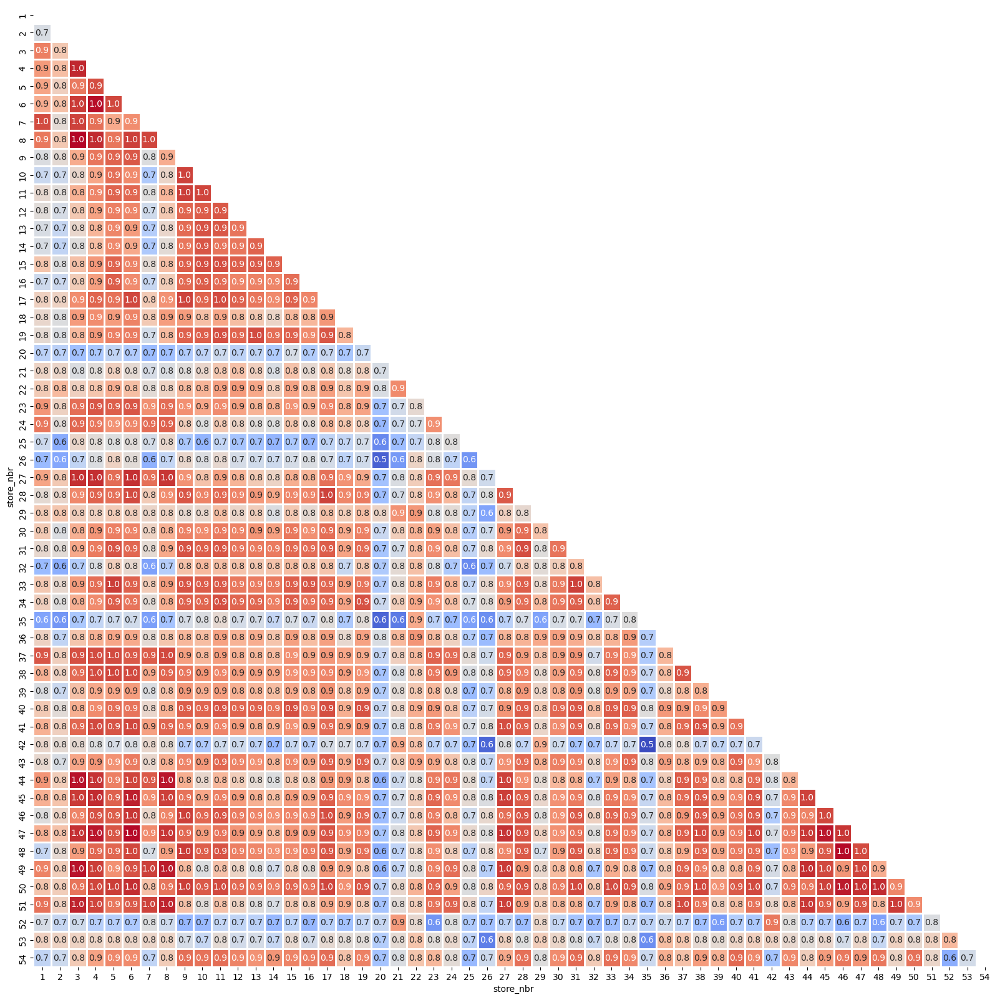

In [49]:
plt.figure(figsize=(20,20))
mask = np.triu(aux)
sns.heatmap(aux,
           annot=True,
           fmt='.1f',
           cmap='coolwarm',
           square='True',
           linewidths=1,
           cbar=False,
           mask=mask)
plt.show()

# Do holidays affect sales?

In [50]:
patternDel = "Terremoto.*" # Filter out the earthquake of 2016
filter1 = df_holidays['description'].str.contains(patternDel)
df_holidays = df_holidays[~filter1]
df_holidays

,type,locale,locale_name,description,transferred
date,,,,,
2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
...,...,...,...,...,...
2017-12-22,Additional,National,Ecuador,Navidad-3,False
2017-12-23,Additional,National,Ecuador,Navidad-2,False
2017-12-24,Additional,National,Ecuador,Navidad-1,False


In [51]:
l = ['2013','2014','2015','2016']
#l = ['2013','2014']

for i in l: # For loop that creates a mean sales by year and a scatter of the holidays of said year
    average_sales = ( # group all store sales by date, get the mean of all sales in a date & condence df to just date and sale #
        store_sales
        .groupby('date').mean()
        .squeeze()
        .loc[i]
    )
    holidays = ( # Get all National and Regional holidays in a given year
    df_holidays
    .query("locale in ['National', 'Regional']")
    .loc[i, ['description']]
    .assign(description=lambda x: x.description.cat.remove_unused_categories())
    )
    
    # Convert df's index from date to st
    average_sales.index =average_sales.index.astype(str)
    holidays.index =holidays.index.astype(str)

    # Remove december 25 from holidays df, store does not open that day
    holidays = holidays.drop(labels = [(i + '-12-25')]) 
    
    t='year ' + i
    print(i)
    
    plt.figure(figsize=(12,6)) # Set figsize
    plt.ylabel('Sales') # Set ylabel

    # displaying the title
    plt.title("Average sales and holidays, " + t)
    plt.plot(average_sales.index,average_sales.values) # plot average sales for date
    plt.scatter(holidays.index, average_sales[holidays.index],color='C3') # scatter plot of holidays
    plt.grid() # add grid
    
    #plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
    plt.xticks(rotation = 90)
    plt.gca().xaxis.set_major_locator(mdates.DayLocator(bymonthday=[1,16]))# Locate days 1 and 16 of all months
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))# put tick in days 1 & 16 of all months, format is day-month
    
    plt.savefig(t+'.png', dpi = 300) #save graph as year n.png
    plt.clf() # Clear graph, plt has troubles rendering the differents plots

2013
2014
2015
2016


<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

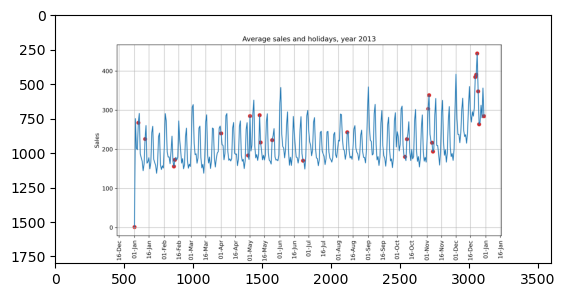

In [52]:
# display image, for a better resolution directly open the file
#2013
imge = img.imread('../working/year 2013.png')
imgplot = plt.imshow(imge)

In [53]:
holidays = (df_holidays
    .query("locale in ['National', 'Regional']")
    .loc['2013', ['description']]
    .assign(description=lambda x: x.description.cat.remove_unused_categories())
    )
holidays

,description
date,
2013-01-01,Primer dia del ano
2013-01-05,Recupero puente Navidad
2013-01-12,Recupero puente primer dia del ano
2013-02-11,Carnaval
2013-02-12,Carnaval
2013-04-01,Provincializacion de Cotopaxi
2013-04-29,Viernes Santo
2013-05-01,Dia del Trabajo
2013-05-11,Dia de la Madre-1


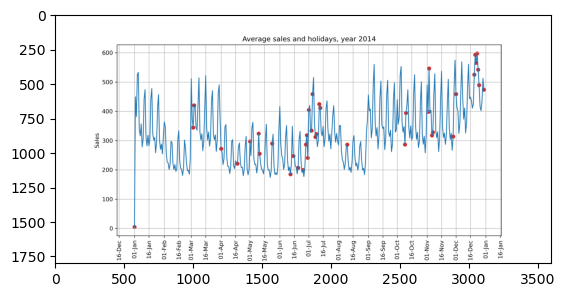

In [54]:
# 2014
imge = img.imread('../working/year 2014.png')
imgplot = plt.imshow(imge)

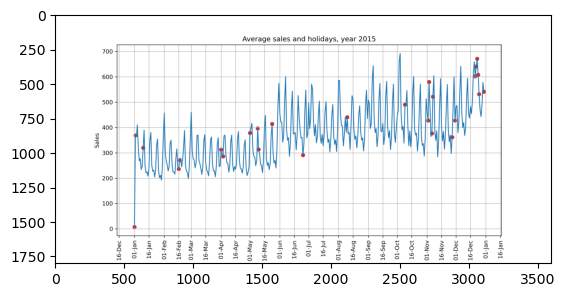

In [55]:
# 2015
imge = img.imread('../working/year 2015.png')
imgplot = plt.imshow(imge)

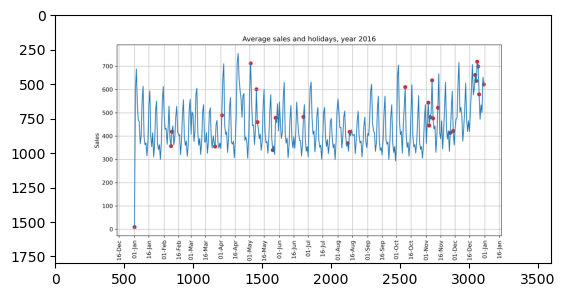

In [56]:
# 2016
imge = img.imread('../working/year 2016.png')
imgplot = plt.imshow(imge)

# Transform holiday data to onehot

In [57]:
holiday_temp = df_holidays[["description"]].copy()

mask = ~holiday_temp.loc[:,'description'].str.contains(r'Terremoto.*', case = False)
df_holidays2 = holiday_temp.loc[mask]

holiday_temp

,description
date,
2012-03-02,Fundacion de Manta
2012-04-01,Provincializacion de Cotopaxi
2012-04-12,Fundacion de Cuenca
2012-04-14,Cantonizacion de Libertad
2012-04-21,Cantonizacion de Riobamba
...,...
2017-12-22,Navidad-3
2017-12-23,Navidad-2
2017-12-24,Navidad-1


In [58]:
#holiday_1hot = df_holidays2['description']
holiday_1hot = pd.get_dummies(df_holidays2, dtype=int)
holiday_1hot = holiday_1hot[['description_Batalla de Pichincha',
 'description_Black Friday',
 'description_Cantonizacion de Cayambe',
 'description_Cantonizacion de El Carmen',
 'description_Cantonizacion de Guaranda',
 'description_Cantonizacion de Latacunga',
 'description_Cantonizacion de Libertad',
 'description_Cantonizacion de Quevedo',
 'description_Cantonizacion de Riobamba',
 'description_Cantonizacion de Salinas',
 'description_Cantonizacion del Puyo',
 'description_Carnaval',
 'description_Cyber Monday',
 'description_Dia de Difuntos',
 'description_Dia de la Madre',
 'description_Dia de la Madre-1',
 'description_Dia del Trabajo',
 'description_Fundacion de Ambato',
 'description_Fundacion de Cuenca',
 'description_Fundacion de Esmeraldas',
 'description_Fundacion de Guayaquil',
 'description_Fundacion de Guayaquil-1',
 'description_Fundacion de Ibarra',
 'description_Fundacion de Loja',
 'description_Fundacion de Machala',
 'description_Fundacion de Manta',
 'description_Fundacion de Quito',
 'description_Fundacion de Quito-1',
 'description_Fundacion de Riobamba',
 'description_Fundacion de Santo Domingo',
 'description_Inauguracion Mundial de futbol Brasil',
 'description_Independencia de Ambato',
 'description_Independencia de Cuenca',
 'description_Independencia de Guaranda',
 'description_Independencia de Guayaquil',
 'description_Independencia de Latacunga',
 'description_Navidad',
 'description_Navidad+1',
 'description_Navidad-1',
 'description_Navidad-2',
 'description_Navidad-3',
 'description_Navidad-4',
 'description_Primer Grito de Independencia',
 'description_Primer dia del ano',
 'description_Primer dia del ano-1',
 'description_Provincializacion Santa Elena',
 'description_Provincializacion de Cotopaxi',
 'description_Provincializacion de Imbabura',
 'description_Provincializacion de Santo Domingo',
 'description_Puente Dia de Difuntos',
 'description_Puente Navidad',
 'description_Puente Primer dia del ano',
 'description_Recupero Puente Dia de Difuntos',
 'description_Recupero Puente Navidad',
 'description_Recupero Puente Primer dia del ano',
 'description_Recupero puente Navidad',
 'description_Recupero puente primer dia del ano','description_Traslado Batalla de Pichincha',
 'description_Traslado Fundacion de Guayaquil',
 'description_Traslado Fundacion de Quito',
 'description_Traslado Independencia de Guayaquil',
 'description_Traslado Primer Grito de Independencia',
 'description_Traslado Primer dia del ano',
 'description_Viernes Santo']]
holiday_1hot

,description_Batalla de Pichincha,description_Black Friday,description_Cantonizacion de Cayambe,description_Cantonizacion de El Carmen,description_Cantonizacion de Guaranda,description_Cantonizacion de Latacunga,description_Cantonizacion de Libertad,description_Cantonizacion de Quevedo,description_Cantonizacion de Riobamba,description_Cantonizacion de Salinas,...,description_Recupero Puente Primer dia del ano,description_Recupero puente Navidad,description_Recupero puente primer dia del ano,description_Traslado Batalla de Pichincha,description_Traslado Fundacion de Guayaquil,description_Traslado Fundacion de Quito,description_Traslado Independencia de Guayaquil,description_Traslado Primer Grito de Independencia,description_Traslado Primer dia del ano,description_Viernes Santo
date,,,,,,,,,,,,,,,,,,,,,
2012-03-02,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2012-04-01,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2012-04-12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2012-04-14,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2012-04-21,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-22,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2017-12-23,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2017-12-24,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# Analizar el total de ventas por familia de productos en cada tienda

In [59]:
store_family = df_train.groupby(["family", "store_nbr"]).tail(60).groupby(["family", "store_nbr"]).sales.sum().reset_index()
store_family

,family,store_nbr,sales
0,AUTOMOTIVE,1,278.000000
1,AUTOMOTIVE,2,391.000000
2,AUTOMOTIVE,3,696.000000
3,AUTOMOTIVE,4,222.000000
4,AUTOMOTIVE,5,393.000000
...,...,...,...
1777,SEAFOOD,50,1212.701050
1778,SEAFOOD,51,3009.459961
1779,SEAFOOD,52,541.513000
1780,SEAFOOD,53,243.000000


In [60]:
px.line(store_family, x = "store_nbr", y= "sales", color = "family", title = "total sales of the Product Family in the stores")

Observemos que en la parte de abajo de la grafica tenemos ventas de 0 en cierta familia de productos por tienda

In [61]:
store_family[store_family.sales == 0]

,family,store_nbr,sales
54,BABY CARE,1,0.0
55,BABY CARE,2,0.0
63,BABY CARE,10,0.0
65,BABY CARE,12,0.0
66,BABY CARE,13,0.0
...,...,...,...
1697,SCHOOL AND OFFICE SUPPLIES,24,0.0
1705,SCHOOL AND OFFICE SUPPLIES,32,0.0
1706,SCHOOL AND OFFICE SUPPLIES,33,0.0
1713,SCHOOL AND OFFICE SUPPLIES,40,0.0


Como podemos ver en efecto hay tiendas que no manejan la venta de algunos productos por lo tanto no son necesarias para nuestro modelo de predicción ya que dichas tiendas para ese producto su predicción simpre sera de cero ventas

In [62]:
#Retiramos esos valores de nuestro DataFrame
print(df_train.shape)
# Anti Join
outer_join = df_train.merge(store_family[store_family.sales == 0].drop("sales",axis = 1), how = 'outer', indicator = True)
df_train = outer_join[~(outer_join._merge == 'both')].drop('_merge', axis = 1)
del outer_join
gc.collect()
df_train.shape

(2780316, 6)


(2629805, 6)

# Analizar si el precio del petróleo influye en las ventas

In [63]:
new = df_train.groupby(["date", "store_nbr"]).sales.sum().reset_index()
new["date"] = pd.to_datetime(new.date)
new

,date,store_nbr,sales
0,2013-01-01,1,0.000000
1,2013-01-01,2,0.000000
2,2013-01-01,3,0.000000
3,2013-01-01,4,0.000000
4,2013-01-01,5,0.000000
...,...,...,...
84247,2017-08-15,50,16879.121094
84248,2017-08-15,51,20154.558594
84249,2017-08-15,52,18600.044922
84250,2017-08-15,53,8208.189453


In [64]:
df_oil["date"] = pd.to_datetime(df_oil.date)
# Resample
df_oil = df_oil.set_index("date").dcoilwtico.resample("D").sum().reset_index()
# Interpolate
df_oil["dcoilwtico"] = np.where(df_oil["dcoilwtico"] == 0, np.nan, df_oil["dcoilwtico"])
df_oil["dcoilwtico_interpolated"] = df_oil.dcoilwtico.interpolate()
# Plot
p = df_oil.melt(id_vars=['date']+list(df_oil.keys()[5:]), var_name='Legend')
px.line(p.sort_values(["Legend", "date"], ascending = [False, True]), x='date', y='value', color='Legend',title = "Daily Oil Price" )

In [65]:
temp = pd.merge(new, df_oil, how = "left")
temp

,date,store_nbr,sales,dcoilwtico,dcoilwtico_interpolated
0,2013-01-01,1,0.000000,NaN,NaN
1,2013-01-01,2,0.000000,NaN,NaN
2,2013-01-01,3,0.000000,NaN,NaN
3,2013-01-01,4,0.000000,NaN,NaN
4,2013-01-01,5,0.000000,NaN,NaN
...,...,...,...,...,...
84247,2017-08-15,50,16879.121094,47.57,47.57
84248,2017-08-15,51,20154.558594,47.57,47.57
84249,2017-08-15,52,18600.044922,47.57,47.57
84250,2017-08-15,53,8208.189453,47.57,47.57


In [66]:
print("Correlation con el precio del petróleo")
print(temp.drop(["store_nbr", "dcoilwtico"], axis = 1).corr("spearman").dcoilwtico_interpolated.loc[["sales"]], "\n")

Correlation con el precio del petróleo
sales   -0.263723
Name: dcoilwtico_interpolated, dtype: float64 



/tmp/ipykernel_32/2632976203.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: xlabel='dcoilwtico_interpolated', ylabel='sales'>

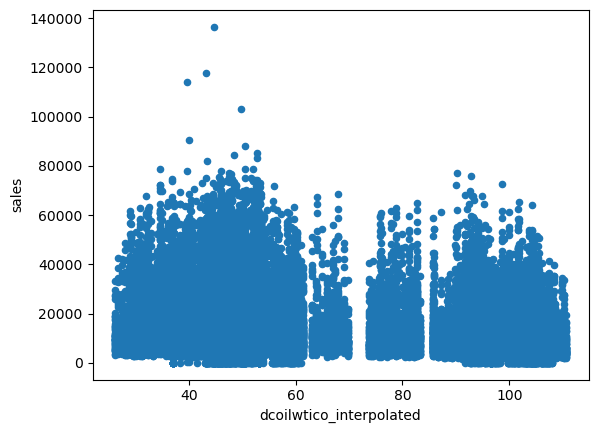

In [67]:
temp.plot.scatter(x = "dcoilwtico_interpolated", y = "sales")

# One hot format para las familias

In [68]:
df_train

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0.0
1,1782,2013-01-02,1,AUTOMOTIVE,2.000,0.0
2,3564,2013-01-03,1,AUTOMOTIVE,3.000,0.0
3,5346,2013-01-04,1,AUTOMOTIVE,3.000,0.0
4,7128,2013-01-05,1,AUTOMOTIVE,5.000,0.0
...,...,...,...,...,...,...
2780311,2993561,2017-08-11,52,SEAFOOD,23.000,3.0
2780312,2995343,2017-08-12,52,SEAFOOD,5.000,0.0
2780313,2997125,2017-08-13,52,SEAFOOD,12.000,0.0
2780314,2998907,2017-08-14,52,SEAFOOD,6.595,0.0


In [69]:
family_1hot = pd.get_dummies(df_train.family)
family_1hot

,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,...,MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2780311,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2780312,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2780313,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2780314,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [70]:
df_train_new = df_train.drop(["family"], axis=1)
df_train_new

,id,date,store_nbr,sales,onpromotion
0,0,2013-01-01,1,0.000,0.0
1,1782,2013-01-02,1,2.000,0.0
2,3564,2013-01-03,1,3.000,0.0
3,5346,2013-01-04,1,3.000,0.0
4,7128,2013-01-05,1,5.000,0.0
...,...,...,...,...,...
2780311,2993561,2017-08-11,52,23.000,3.0
2780312,2995343,2017-08-12,52,5.000,0.0
2780313,2997125,2017-08-13,52,12.000,0.0
2780314,2998907,2017-08-14,52,6.595,0.0


In [71]:
df_train_new = df_train_new.join(family_1hot)

# Merge con holidays

In [72]:
holiday_1hot

,description_Batalla de Pichincha,description_Black Friday,description_Cantonizacion de Cayambe,description_Cantonizacion de El Carmen,description_Cantonizacion de Guaranda,description_Cantonizacion de Latacunga,description_Cantonizacion de Libertad,description_Cantonizacion de Quevedo,description_Cantonizacion de Riobamba,description_Cantonizacion de Salinas,...,description_Recupero Puente Primer dia del ano,description_Recupero puente Navidad,description_Recupero puente primer dia del ano,description_Traslado Batalla de Pichincha,description_Traslado Fundacion de Guayaquil,description_Traslado Fundacion de Quito,description_Traslado Independencia de Guayaquil,description_Traslado Primer Grito de Independencia,description_Traslado Primer dia del ano,description_Viernes Santo
date,,,,,,,,,,,,,,,,,,,,,
2012-03-02,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2012-04-01,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2012-04-12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2012-04-14,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2012-04-21,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-22,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2017-12-23,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2017-12-24,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [73]:
holiday_1hot = holiday_1hot.reset_index()


In [74]:
holiday_1hot

,date,description_Batalla de Pichincha,description_Black Friday,description_Cantonizacion de Cayambe,description_Cantonizacion de El Carmen,description_Cantonizacion de Guaranda,description_Cantonizacion de Latacunga,description_Cantonizacion de Libertad,description_Cantonizacion de Quevedo,description_Cantonizacion de Riobamba,...,description_Recupero Puente Primer dia del ano,description_Recupero puente Navidad,description_Recupero puente primer dia del ano,description_Traslado Batalla de Pichincha,description_Traslado Fundacion de Guayaquil,description_Traslado Fundacion de Quito,description_Traslado Independencia de Guayaquil,description_Traslado Primer Grito de Independencia,description_Traslado Primer dia del ano,description_Viernes Santo
0,2012-03-02,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2012-04-01,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2012-04-12,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2012-04-14,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2012-04-21,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
314,2017-12-22,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
315,2017-12-23,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
316,2017-12-24,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
317,2017-12-25,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [75]:
df_train_merged = pd.merge(df_train_new, holiday_1hot, how='left')

In [76]:
df_train_merged

,id,date,store_nbr,sales,onpromotion,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,...,description_Recupero Puente Primer dia del ano,description_Recupero puente Navidad,description_Recupero puente primer dia del ano,description_Traslado Batalla de Pichincha,description_Traslado Fundacion de Guayaquil,description_Traslado Fundacion de Quito,description_Traslado Independencia de Guayaquil,description_Traslado Primer Grito de Independencia,description_Traslado Primer dia del ano,description_Viernes Santo
0,0,2013-01-01 00:00:00,1,0.000,0.0,1,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1782,2013-01-02 00:00:00,1,2.000,0.0,1,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3564,2013-01-03 00:00:00,1,3.000,0.0,1,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5346,2013-01-04 00:00:00,1,3.000,0.0,1,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,7128,2013-01-05 00:00:00,1,5.000,0.0,1,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2629800,2993561,2017-08-11 00:00:00,52,23.000,3.0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2629801,2995343,2017-08-12 00:00:00,52,5.000,0.0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2629802,2997125,2017-08-13 00:00:00,52,12.000,0.0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2629803,2998907,2017-08-14 00:00:00,52,6.595,0.0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
